<a href="https://colab.research.google.com/github/melissacphillips/ChicagoPublicSchools/blob/master/AISDemo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Looking for Port Boundaries

In [ ]:
# !pip install geopandas

In [ ]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint

In [ ]:
plt.rcParams["figure.figsize"] = (20,20)

In [ ]:
## AIS data from https://marinecadastre.gov/ais/
## collected on 2021_01_01

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df1 = pd.read_csv("/content/drive/MyDrive/AIS_2021_01_01.csv")

In [ ]:
# reducing size for demonstation purposes
df = df1.head(100000)

In [ ]:
df1 = pd.DataFrame()

In [ ]:
df.shape

(100000, 17)

In [ ]:
df.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass
0,316044349,2021-01-01T00:00:21,33.18979,-79.27309,0.0,-62.7,511.0,BAGHEERA II,IMO0000000,NaN,36.0,NaN,73.0,4.0,NaN,NaN,B
1,368032120,2021-01-01T00:00:20,27.81788,-97.46591,0.0,29.7,101.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,B
2,367645040,2021-01-01T00:00:18,30.70844,-88.04354,0.0,-128.8,298.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,A
3,367188380,2021-01-01T00:00:19,29.90894,-81.29914,0.2,-194.8,511.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,B
4,338321083,2021-01-01T00:00:28,27.79628,-97.38891,0.0,-49.6,511.0,PROVIDENCE,IMO0000000,NaN,37.0,NaN,11.0,4.0,NaN,NaN,B


In [ ]:
# drop nulls and duplicates
df_clean = df.dropna(axis=0, how='any', inplace=False)
df_clean.drop_duplicates(keep='first', inplace=True)
df = pd.DataFrame()

/usr/local/lib/python3.8/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [ ]:
df_clean.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass
21,366984540,2021-01-01T00:00:35,28.92313,-82.99101,0.1,-159.3,69.0,BALTIMORE,IMO8830932,WAA5496,31.0,1.0,38.0,10.0,4.9,52.0,A
48,367028770,2021-01-01T00:00:10,31.14745,-81.49808,0.0,107.0,511.0,CROSBY STAR,IMO8964628,WCY5782,31.0,0.0,30.0,9.0,3.9,31.0,B
69,367108030,2021-01-01T00:00:07,32.08193,-81.06413,0.0,-161.7,267.0,EDWARD J MORAN,IMO9365336,WDC9891,31.0,0.0,29.0,11.0,4.0,52.0,B
71,352375000,2021-01-01T00:00:49,33.76005,-118.25709,0.0,-109.7,68.0,NYK LAURA,IMO9406752,H9LL,70.0,5.0,210.0,30.0,11.5,70.0,A
75,368087000,2021-01-01T00:00:21,29.13228,-90.21846,0.0,-178.1,254.0,C-CARRIER,IMO9205122,WCY2601,90.0,0.0,73.0,17.0,4.8,70.0,B


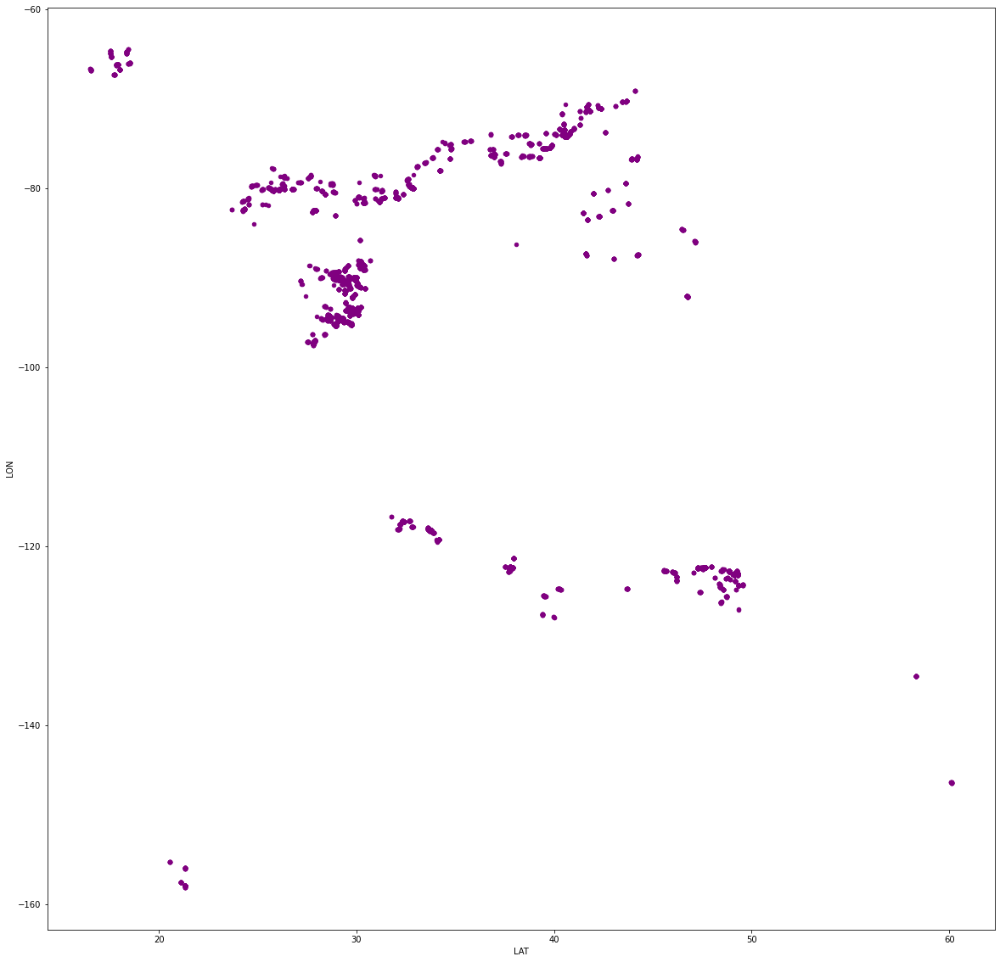

In [ ]:
# where are these vessels?
df_clean.plot.scatter(x='LAT',
                      y='LON',
                      c='Purple');

## Creating a DataFrame Just For Very Slow/Stopped Vessels

In [ ]:
# very slow is < 0.5 knots
df_slow = df_clean[df_clean.SOG < 0.5]

In [ ]:
df_slow.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass
21,366984540,2021-01-01T00:00:35,28.92313,-82.99101,0.1,-159.3,69.0,BALTIMORE,IMO8830932,WAA5496,31.0,1.0,38.0,10.0,4.9,52.0,A
48,367028770,2021-01-01T00:00:10,31.14745,-81.49808,0.0,107.0,511.0,CROSBY STAR,IMO8964628,WCY5782,31.0,0.0,30.0,9.0,3.9,31.0,B
69,367108030,2021-01-01T00:00:07,32.08193,-81.06413,0.0,-161.7,267.0,EDWARD J MORAN,IMO9365336,WDC9891,31.0,0.0,29.0,11.0,4.0,52.0,B
71,352375000,2021-01-01T00:00:49,33.76005,-118.25709,0.0,-109.7,68.0,NYK LAURA,IMO9406752,H9LL,70.0,5.0,210.0,30.0,11.5,70.0,A
75,368087000,2021-01-01T00:00:21,29.13228,-90.21846,0.0,-178.1,254.0,C-CARRIER,IMO9205122,WCY2601,90.0,0.0,73.0,17.0,4.8,70.0,B


In [ ]:
df_slow["LAT"].max(), df_slow["LAT"].min()

(58.32434, 17.93671)

In [ ]:
df_slow["LON"].max(), df_slow["LON"].min()

(-64.44525, -158.11628)

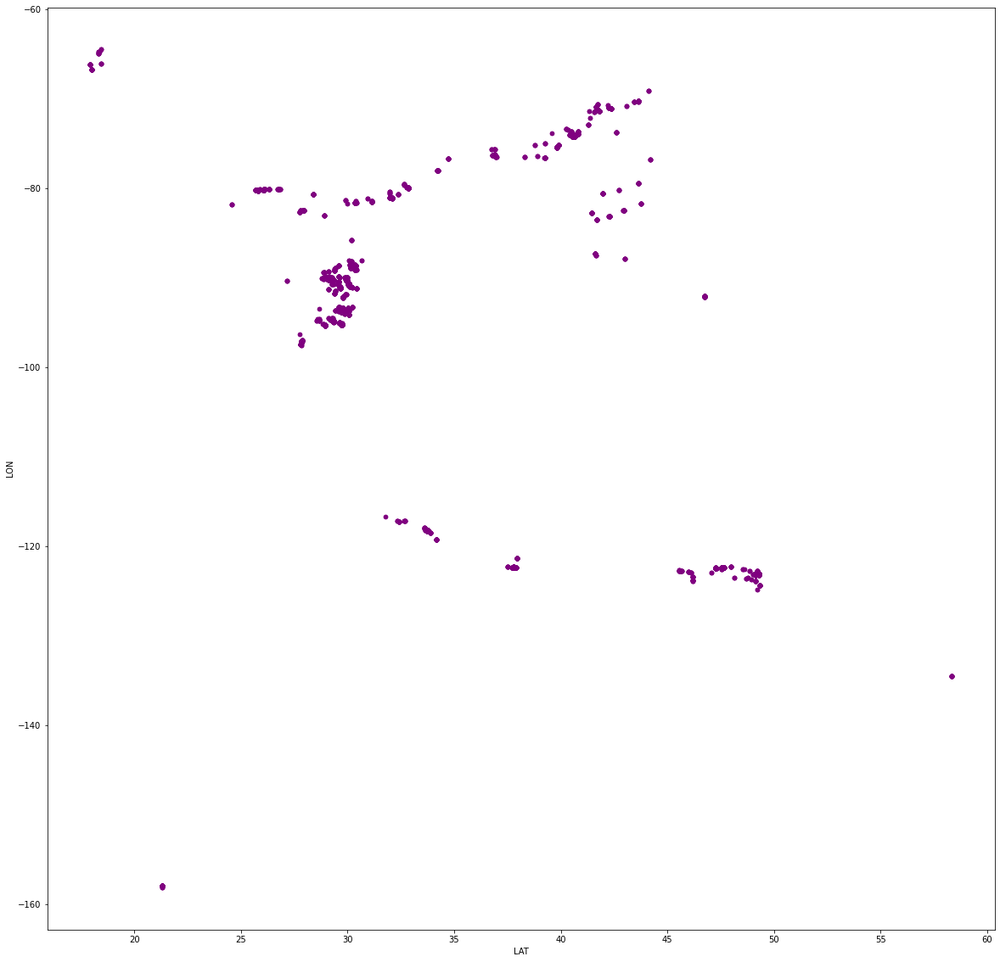

In [ ]:
df_slow.plot.scatter(x='LAT',
                      y='LON',
                      c='Purple');

In [ ]:
# check size to see how feasible to plot
df_slow.shape

(6860, 17)

In [ ]:
# reduce the dataframe size using geographical bounds
df_slow_reduced = df_slow[(df_slow["LAT"] < 50) & (df_slow["LAT"] > 20) & (df_slow["LON"] > -140) & (df_slow["LON"] < -65 )]

In [ ]:
df_slow_reduced.shape

(6684, 17)

In [ ]:
df_slow_reduced.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass
21,366984540,2021-01-01T00:00:35,28.92313,-82.99101,0.1,-159.3,69.0,BALTIMORE,IMO8830932,WAA5496,31.0,1.0,38.0,10.0,4.9,52.0,A
48,367028770,2021-01-01T00:00:10,31.14745,-81.49808,0.0,107.0,511.0,CROSBY STAR,IMO8964628,WCY5782,31.0,0.0,30.0,9.0,3.9,31.0,B
69,367108030,2021-01-01T00:00:07,32.08193,-81.06413,0.0,-161.7,267.0,EDWARD J MORAN,IMO9365336,WDC9891,31.0,0.0,29.0,11.0,4.0,52.0,B
71,352375000,2021-01-01T00:00:49,33.76005,-118.25709,0.0,-109.7,68.0,NYK LAURA,IMO9406752,H9LL,70.0,5.0,210.0,30.0,11.5,70.0,A
75,368087000,2021-01-01T00:00:21,29.13228,-90.21846,0.0,-178.1,254.0,C-CARRIER,IMO9205122,WCY2601,90.0,0.0,73.0,17.0,4.8,70.0,B


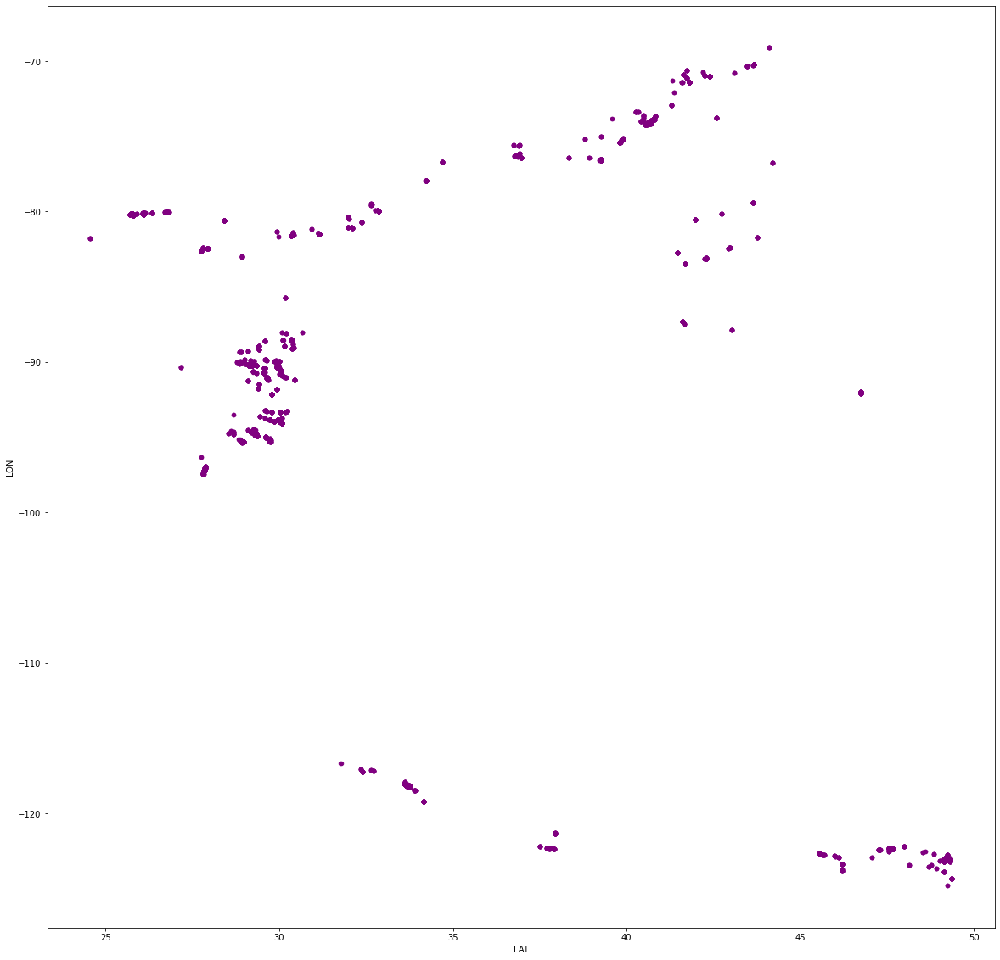

In [ ]:
# plot df_slow_reduced
df_slow_reduced.plot.scatter(x='LAT',
                      y='LON',
                      c='Purple');

In [ ]:
# pick location for folium map
latitude = 37
longitude = -100

In [ ]:
map1 = folium.Map(
                location = [latitude, longitude],
                zoom_start = 10)

In [ ]:
#  map vessels with folium -- use VesselName as label
slow_vessels = folium.map.FeatureGroup()
latitudes = list(df_slow_reduced.LAT)
longitudes = list(df_slow_reduced.LON)
labels = list(df_slow_reduced.VesselName)
for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker(
      location = [lat, lng],
      popup = label,
      icon = folium.Icon(color='red', icon='info-sign')
     ).add_to(map1)

In [ ]:
map1

# Clustering Algorithm -- DBSCAN

In [ ]:
df_slow_reduced.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass
21,366984540,2021-01-01T00:00:35,28.92313,-82.99101,0.1,-159.3,69.0,BALTIMORE,IMO8830932,WAA5496,31.0,1.0,38.0,10.0,4.9,52.0,A
48,367028770,2021-01-01T00:00:10,31.14745,-81.49808,0.0,107.0,511.0,CROSBY STAR,IMO8964628,WCY5782,31.0,0.0,30.0,9.0,3.9,31.0,B
69,367108030,2021-01-01T00:00:07,32.08193,-81.06413,0.0,-161.7,267.0,EDWARD J MORAN,IMO9365336,WDC9891,31.0,0.0,29.0,11.0,4.0,52.0,B
71,352375000,2021-01-01T00:00:49,33.76005,-118.25709,0.0,-109.7,68.0,NYK LAURA,IMO9406752,H9LL,70.0,5.0,210.0,30.0,11.5,70.0,A
75,368087000,2021-01-01T00:00:21,29.13228,-90.21846,0.0,-178.1,254.0,C-CARRIER,IMO9205122,WCY2601,90.0,0.0,73.0,17.0,4.8,70.0,B


In [ ]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
coords = df_slow_reduced[['LAT', 'LON']].to_numpy()


In [ ]:
# first DBSCAN with epsilon = 1.5 km
kms_per_radian = 6371.0088
epsilon = 1.5 / kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))


Number of clusters: 369


In [ ]:
df_slow_reduced["label1"]=cluster_labels

<ipython-input-166-6e740a67f24f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow_reduced["label1"]=cluster_labels


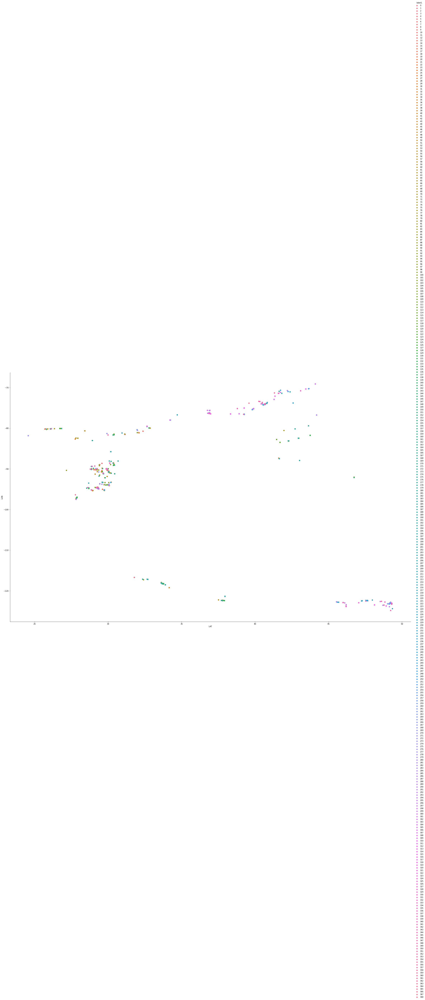

In [ ]:
# plot label #1
fg = sns.FacetGrid(data=df_slow_reduced, hue='label1', height=20, aspect=1.61)
fg.map(plt.scatter, 'LAT', 'LON').add_legend()


In [ ]:
kms_per_radian = 6371.0088
epsilon = 20 / kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))


Number of clusters: 120


<ipython-input-170-19cc0c11d2de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow_reduced["label2"]=cluster_labels


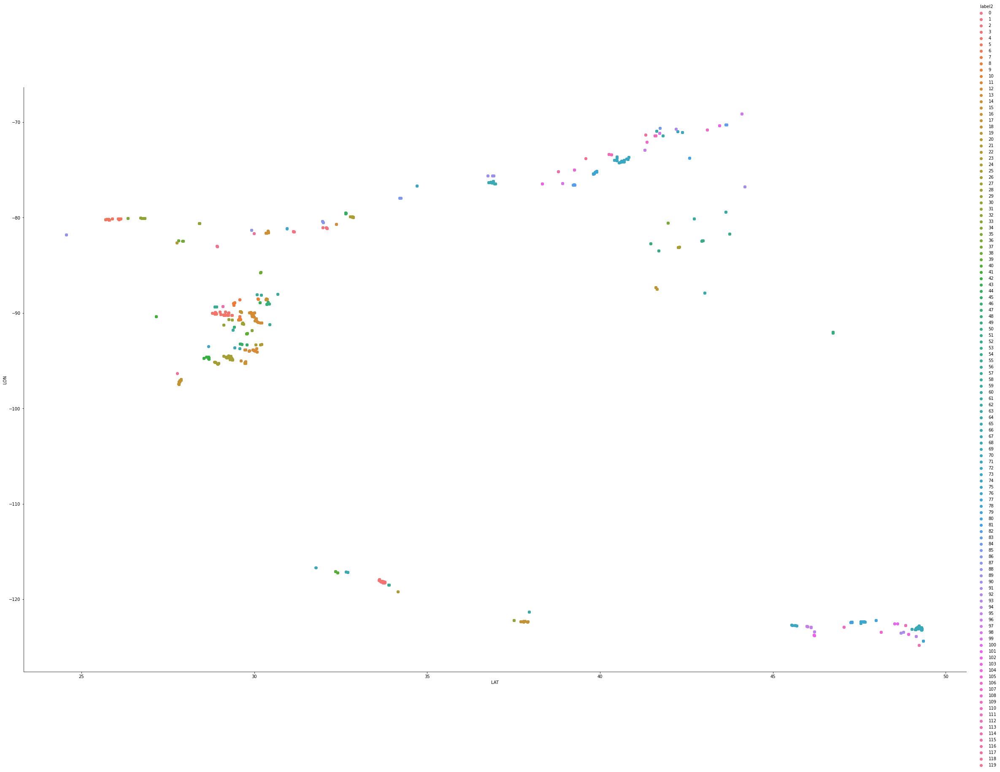

In [ ]:
# plot label 2
df_slow_reduced["label2"]=cluster_labels

fg = sns.FacetGrid(data=df_slow_reduced, hue='label2', height=20, aspect=1.61)
fg.map(plt.scatter, 'LAT', 'LON').add_legend()



In [ ]:
kms_per_radian = 6371.0088
epsilon = 100 / kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))


Number of clusters: 33


In [ ]:
df_slow_reduced["label3"]=cluster_labels

<ipython-input-174-4eaafaa06bfc>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow_reduced["label3"]=cluster_labels


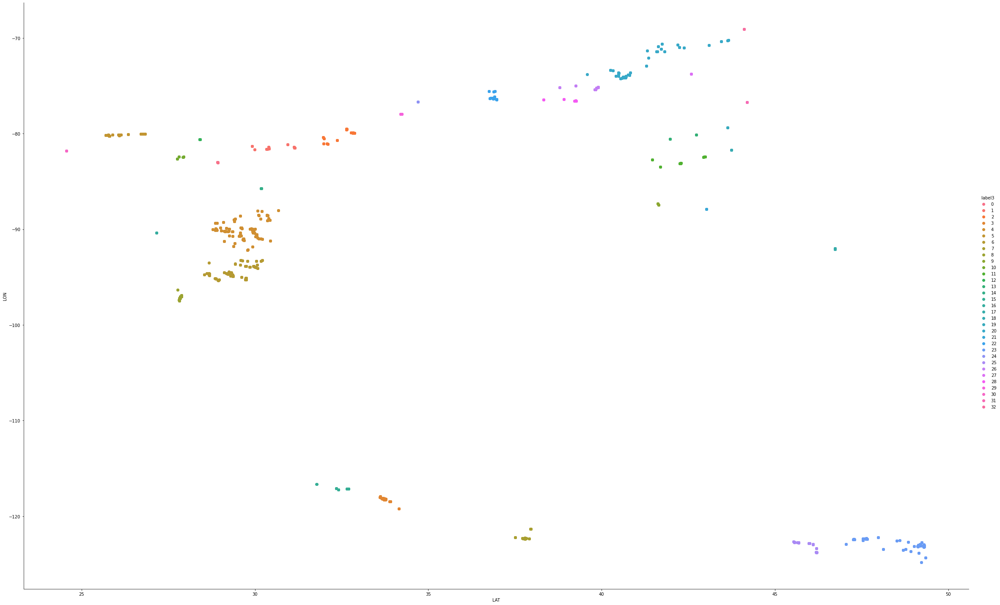

In [ ]:
# plot label 3
fg = sns.FacetGrid(data=df_slow_reduced, hue='label3', height=20, aspect=1.61)
fg.map(plt.scatter, 'LAT', 'LON').add_legend()


In [ ]:
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])

In [ ]:
cluster_id = 2
x_list = list()
y_list = list()

In [ ]:
for i in range(len(clusters[cluster_id])):
  x_list.append(clusters[cluster_id][i][0])
  y_list.append(clusters[cluster_id][i][1])


In [ ]:
cluster_geoseries = gpd.GeoSeries.from_xy(x_list, y_list)

In [ ]:
cluster_geoseries

0      POINT (32.08193 -81.06413)
1      POINT (32.37202 -80.69290)
2      POINT (32.82565 -79.93206)
3      POINT (32.09986 -81.11325)
4      POINT (32.83487 -79.89584)
                  ...            
219    POINT (32.83481 -79.89591)
220    POINT (32.37198 -80.69292)
221    POINT (32.85960 -79.95911)
222    POINT (32.64188 -79.48407)
223    POINT (32.83480 -79.89588)
Length: 224, dtype: geometry

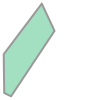

In [ ]:
cluster_geoseries.unary_union.convex_hull

Next Steps:
1. Decide on best epsilon for clustering
2. Create polygons for clusters
3. Choose polygons that intersect with a port location
4. Clean up code/write report
